In [1]:
from ml_dl_experiments import settings, show_image_from_source
from IPython.display import Image

# Архитектура YOLOv1 - ...v5. Backbone, Neck, Head

***
Кратко вспомним принцип работы R-CNN: 

1. Сначала специальный алгоритм находил на изображении потенциально интересные области. Обычно их тысячи.
    
2. Затем каждый регион анализировался отдельно, чтобы понять, есть ли там объект.

Это точный подход, но из-за двухступенчатой структуры очень медленный.

YOLO предложил революционную идею — **смотреть на изображение всего один раз. Модель за один проход предсказывает сразу всё: и где находятся объекты, и к какому классу они относятся.**
***

## Backbone-Neck-Head

Утвердился модульный подход — трёхкомпонентная архитектура, которая стала стандартной: Backbone, Neck и Head.

Такая декомпозиция отражает фундаментальные подзадачи, которые должна решать нейросеть:

- **Извлечение признаков (Feature Extraction)**. Нейросеть преобразовывает входное изображение из пиксельного пространства в пространство семантически насыщенных признаков.
- **Агрегирование признаков (Feature Aggregation)**. Нейросеть интегрирует информацию с разных уровней иерархии признаков и представляет её одновременно как глобальный контекст, так и локальные детали.
- **Формирование предсказаний (Prediction Generation)**. Нейросеть преобразовывает обработанные признаки в итоговые результаты: координаты ограничивающих рамок и метки классов.

Компоненты Backbone, Neck и Head воплощают эти идеи: 

- Backbone извлекает признаки, 
- Neck их агрегирует, 
- а Head формирует предсказания.

Такой подход позволяет логически декомпозировать нейросеть, а также работать с каждой частью и улучшать её отдельно. 

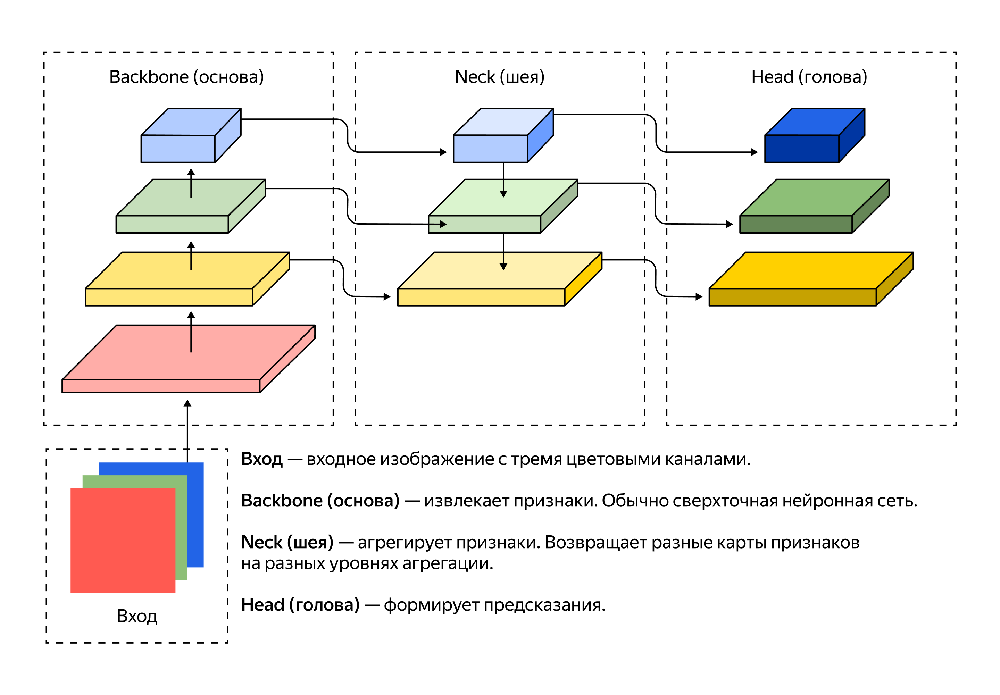

In [5]:
source: str = "ml_dl/cv/bnh1.png"
show_image_from_source(source, width=800)

**Backbone (основа)**

<u>Backbone извлекает признаки.</u> 

Это глубокая свёрточная нейросеть, которая часто предобучена на задачах классификации изображений (например, на датасете ImageNet). 

Основная задача Backbone — **последовательно уменьшать пространственное разрешение входного изображения, одновременно увеличивая глубину или семантическую сложность карт признаков (feature maps).** 

Примеры архитектур: VGG, ResNet, EfficientNet.

**Neck (шея)**

<u>Извлекает и агрегирует признаки.</u> 

Neck — промежуточное звено, которое решает фундаментальную проблему детекторов: как эффективно использовать и признаки для точной локализации (с ранних слоёв Backbone), и признаки для уверенной классификации (с глубоких слоёв). 
**На выходе Neck мы получаем новый набор карт признаков, где каждый уровень обогащён информацией с других уровней.**

**Head (голова)**

<u>Формирует предсказания.</u> 

Голова — это конечный блок, который принимает на вход обработанные карты признаков от «шеи», выполняет на них итоговые свёрточные операции и получает предсказания. 

**Head выдаёт финальный набор предсказаний, который после постобработки становится результатом работы детектора.**

Простой пример архитектуры головы — FC-слой с softmax на конце.  

## YOLOv1(2015)

### Архитектура:

Фундаментальная идея такая: авторы взяли мощную свёрточную сеть, предназначенную для классификации, и доработали её конечную часть для решения задачи детекции.

Взглянем на классическую сверточную нейросеть - vgg16:

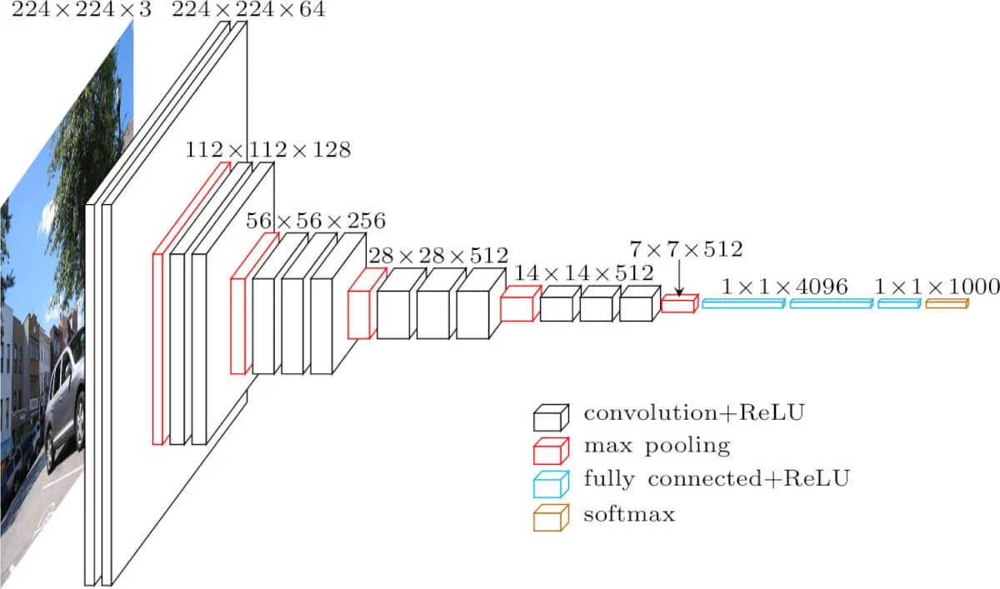

In [3]:
source: str = "ml_dl/cv/vgg16-classic.jpg"
show_image_from_source(source, width=800)

Чем глубже мы продвигаемся по свёрточной сети, тем выше уровень абстракции извлекаемых признаков. Рассмотрим, к примеру, тензор 7×7×512 на выходе одного из глубоких слоёв. Это карта 7×7, всего в ней 49 ячеек. Каждая ячейка соответствует определённой, довольно большой области на исходном изображении — её рецептивному полю, той области исходного изображения, которую видит один конкретный нейрон. А вектор из 512 признаков внутри этой ячейки кодирует высокоуровневые концепции, которые сеть научилась видеть в этой области. 

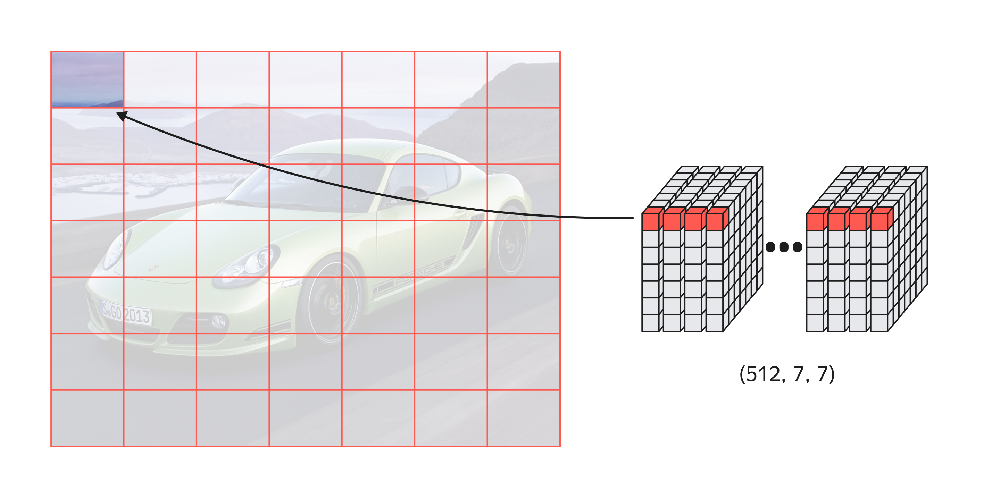

In [4]:
source: str = "ml_dl/cv/receptive1.png"
show_image_from_source(source, width=800)

Теперь, если представить, что мы имеем идеальный случай и каждый объект на изображении попал в свою ячейку. В таком случае после обработки мы будем иметь по тензору на каждый объект на изображении и задача нейросети останеться только в том, чтобы выучиться предсказывать данные об этом объекте и рамку.

Проблема такого подхода в том,что объекты на изображении чаще всего занимают больше одной ячейки.

Тогда было предложено следующее - пусть за детекцию объекта будет отвечать только одна ячейка сетки - та, в которую попадает центр его истинной рамки.

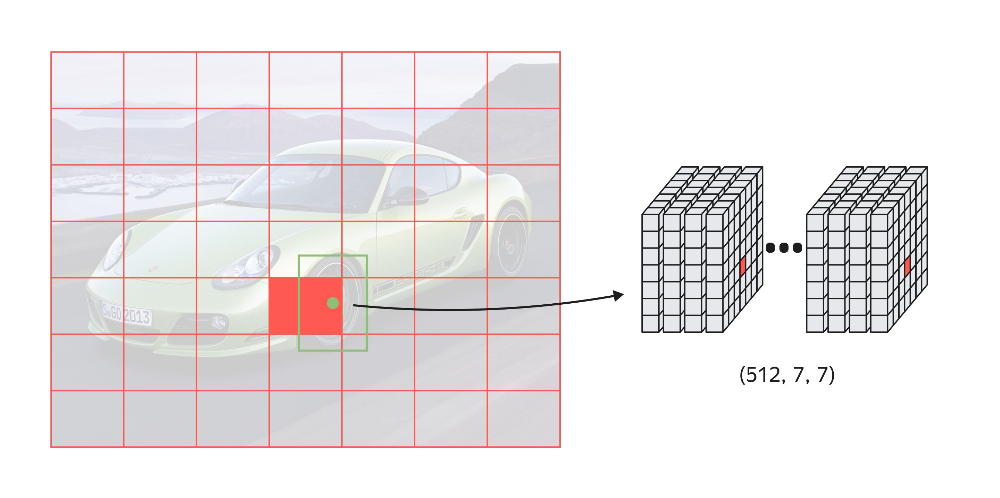

In [5]:
source: str = "ml_dl/cv/receptive2.png"
show_image_from_source(source, width=800)

Для каждой ячейки предсказывается несколько значений:

- Координаты центра (x, y). Предсказываются относительно левого верхнего угла этой самой ячейки. Например, значение x=0.5, y=0.5 будет означать, что центр объекта находится ровно в центре ячейки.
    
- Ширина и высота рамки (w, h). Предсказываются относительно размеров всего изображения. Так рамка может быть больше самой ячейки, что и решает исходную проблему с крупными объектами.
    
- Уверенность (confidence, c). Отражает, насколько модель уверена в двух моментах: в рамке есть объект и рамка хорошо его описывает. Концептуально уверенность рассчитывается так: 
    
    - c = P(Объект) × IoU,
    
    - где P(Объект) — это вероятность наличия объекта в рамке, а IoU — пересечение предсказанной рамки и истинной.
    Вероятности классов (p1, …, pn).

Таким образом, в оригинальной статье для обучения модели (а не для её предсказания) формируется **эталонный (Ground Truth, GT) тензор**. Его размер — 7×7×P, где P вычисляется по формуле P = 5 × B + num_classes. Здесь: 

- B — количество предсказываемых рамок для одной клетки. В оригинальной статье брали B=2.
    
- 5 — количество элементов в наборе [x, y, w, h, c].
    
- num_classes — вектор вероятностей классов.

Этот вектор классов формируется один на всю ячейку, а не на каждую рамку. В GT-тензоре он представлен в формате one-hot: на позиции, соответствующей классу объекта, стоит 1, а на остальных — 0. Эта особенность стала главным ограничением YOLOv1. Если центры нескольких объектов попадали в одну ячейку, модель не могла детектировать их все. 

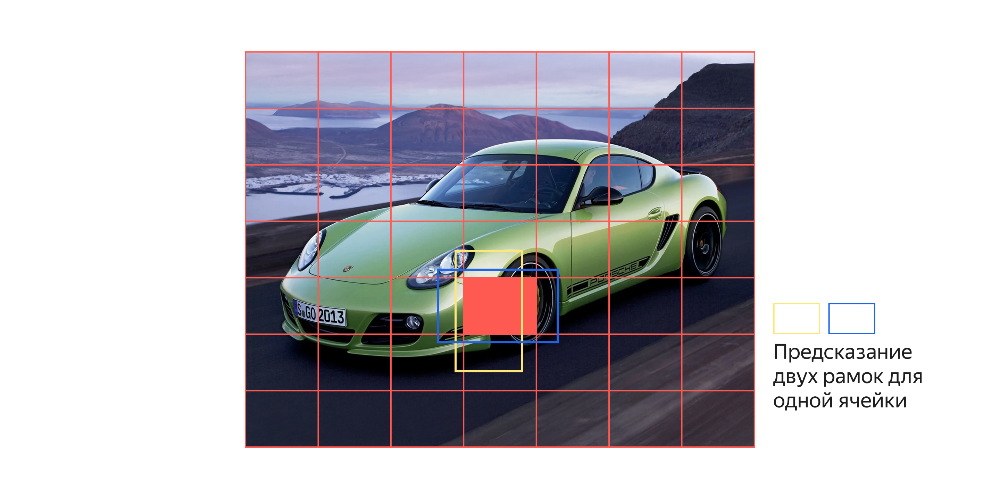

In [6]:
source: str = "ml_dl/cv/receptive3.png"
show_image_from_source(source, width=800)

### Реализация.


1. В качестве основы (backbone) авторы использовали архитектуру, похожую на GoogLeNet. Её свёрточные слои были предварительно обучены на ImageNet, чтобы научиться извлекать качественные признаки.

2. Самое интересное происходило в «голове»: полученный от backbone тензор 7×7×1024 «распрямлялся» и проходил через два полносвязных слоя. Последний из них и формировал итоговый тензор предсказаний 7×7×30. Затем вся эта полная архитектура обучалась решать задачу детекции на датасете Pascal VOC.

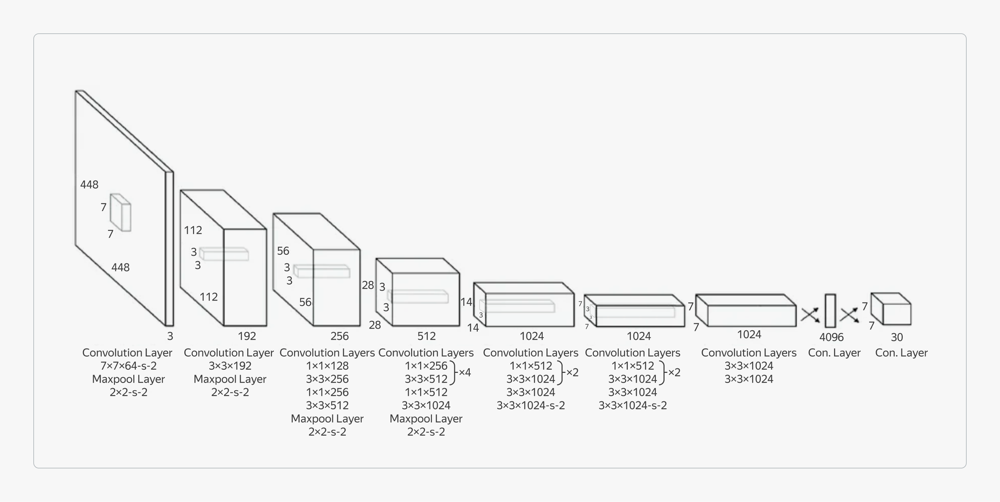

In [7]:
source: str = "ml_dl/cv/yolov1.1.png"
show_image_from_source(source, width=800)

Из статьи:

YOLO предсказывает несколько ограничивающих рамок для каждой ячейки сетки.

Во время обучения мы хотим, чтобы только один предсказатель ограничивающих рамок
отвечал за каждый объект.

Мы назначаем один предсказатель, который «отвечает» за предсказание объекта, основываясь на том, какое предсказание **имеет наивысший текущий IOU по отношению к истинному значению**.

Это приводит к специализации между предикторами ограничивающих рамок. 

Каждый предсказатель лучше предсказывает определенные размеры, соотношения сторон или классы объектов, улучшая общую
полноту.

Поэтому перед тем как считать лосс, мы считаем IOU чтобы определить "отвечающие" за предсказание боксы. 

**Вспомним про IoU**
- iou (Intersection over Union — пересечение через объединение) — это метрика, которая измеряет, насколько сильно перекрываются две прямоугольные рамки.

Она вычисляет отношение площади их пересечения к площади их объединения.
$$
iou=\frac{Площадь\ \ пересечения}{Площадь\ \ объединения}
$$

- Пересечение (intersection) — это область, где два прямоугольника накладываются друг на друга.

- Объединение (union) — общая площадь, которую занимают оба прямоугольника, без двойного учёта пересечения.

**Функция потерь** в YOLOv1:
- Штраф осуществляется за три типа ошибок:

1. **Ошибка локализации** - Наказывает за неточное предсказание рамки (координаты, ширина, высота)
$$
Loss_{xy}​+Loss_{wh}​=λ_{coord​}⋅\sum_{i=0}^{S^2}​\sum_{j=0}^{B}​1_{ij}^{obj}​[(x_i​−\widehat{x_i​​})^2+(yi​−\widehat{y_i}​)^2]+λ_{coord​}⋅\sum_{i=0}^{S^2}​\sum_{j=0}^{B}​1_{ij}^{obj}​[(\sqrt{w_i}​−\sqrt{\widehat{w_i​}​})^2+(\sqrt{h_i​}−\sqrt{\widehat{h_i}​​})^2].
$$
Здесь:

 - $S^2$ — количество ячеек в сетке. В оригинальной статье оно равно 7×7=49.
    
- $B$ — количество bounding box'ов, которые предсказывает каждая ячейка. В YOLOv1 B=2.
    
- $x_i, y_i, w_i, h_i$​ — истинные координаты и размеры рамки объекта, который попал в ячейку $i$.
    
- $\widehat{x_i}, \widehat{y_i}, \widehat{w_i}, \widehat{h_i}$​ — предсказанные моделью координаты и размеры рамки.
    
- $1_{ij}^{obj}$​ — индикаторная функция. Она равна 1, если в ячейке $i$ есть объект, и нулю во всех остальных случаях.

Эта формула — сумма квадратов ошибок для координат центра рамки и сумму квадратов ошибок для ширины и высоты. Они вычисляются только для «ответственных» рамок по всем детекциям и по всем ячейкам. Коэффициент $λ_{coord​}$ (равный 5) увеличивает значимость этой ошибки. 



2. **Ошибка уверенности (confidence)** описывает, насколько ошибочно предсказана уверенность в наличии или отсутствии объекта.
$$
Loss_{conf\ obj}+Loss_{conf\ no \ obj}=\sum_{i=0}^{S^2}\sum_{j=0}^{B}1_{ij}^{obj}[(C_i−\widehat{C_i})^2]+\lambda_{no \ obj}\sum_{i=0}^{S^2}\sum_{j=0}^{B}1_{ij}^{no\ obj}[(C_i−\widehat{C_i})^2]
$$
Здесь 


- $C_i$​ — истинная уверенность. Если в ячейке есть объект, то $C_i$ равно реальному IoU между предсказанной и истинной рамками. Если объекта нет, то $C_i = 0$.

- $\widehat{C_i}$ обозначена предсказанная уверенность.\

- $λ_{no \ obj}$​ (равный 0.5) ослабляет влияние этих негативных примеров, чтобы сбалансировать обучение.

Эта формула — сумма двух частей: 

- суммы квадратов ошибок для уверенности (confidence), вычисленная для рамок с объектами;
    
- и суммы квадратов ошибок для уверенности, вычисленная для всех рамок без объектов. 
    
Здесь $C$ (истинная уверенность) стремится к 1. 

3. **Ошибка классификации** описывает, насколько неверно предсказан класс объекта:
$$
Loss_{class}=\sum_{i=0}^{S^2} 1_{i}^{obj}\sum_{c∈classes}(p_i(c)−\hat{p_i}(c))^2]
$$
Здесь:

- $1_{i}^{obj}$ - 1 если объект появляется в ячейке, 0 в ином случае,

- $c$ — конкретный класс из списка всех возможных классов (classes).
  
- $p_i(c)$ — истинное распределение вероятностей для ячейки $i$. 
Это вектор, где на позиции, соответствующей правильному классу, стоит 1, а на всех остальных — 0.
    
- $\hat{p_i}(c)$ — предсказанное моделью распределение вероятностей для ячейки $i$.

Лосс вычисляется как сумма квадратов разностей для каждого элемента в векторе классов.

Итоговая формула Loss для всей модели:
$$
Loss=Loss_{xy}+Loss_{wh}+Loss_{conf \ obj}+Loss_{conf \ no \ obj}+Loss_{class}.
$$

Такая формула одновременно учит модель точно ставить рамки, корректно оценивать наличие объекта и правильно определять его класс.

### Подробнее про расчет loss:

Давайте разберём **функцию потерь из YOLOv1** по частям — **не абстрактно, а на конкретном маленьком примере**, чтобы было понятно, **что и зачем штрафуется**.

---

**🧩 Контекст: задача и структура предсказания**

- Изображение делится на **S × S = 2 × 2** сетку (для простоты).
- В каждой ячейке предсказывается **B = 2** bounding box'а.
- Есть **C = 3** класса: `cat`, `dog`, `bird`.
- Значит, каждая ячейка выдаёт тензор:  
  $$
  B \cdot 5 + C = 2 \cdot 5 + 3 = 13 \text{ значений}
  $$
  → для 2×2 сетки: выход модели — **2×2×13**.

> Но мы рассмотрим **одну конкретную ячейку**, в которой **есть объект** (например, кот).

---

**🎯 Истинные данные (ground truth) для этой ячейки:**
- Объект: **cat**
- Центр объекта попадает в эту ячейку → **ячейка "отвечает" за объект**.
- Истинный bounding box (нормализованный):  
  $$
  x = 0.6,\ y = 0.7,\ w = 0.4,\ h = 0.5
  $$
  (координаты центра — относительно ячейки, ширина/высота — относительно всего изображения)

---

**🤖 Предсказания модели для этой ячейки:**
- **Box 1**:  
  $ x_1 = 0.55,\ y_1 = 0.68,\ w_1 = 0.38,\ h_1 = 0.48,\ \text{conf}_1 = 0.9 $
- **Box 2**:  
  $ x_2 = 0.2,\ y_2 = 0.3,\ w_2 = 0.6,\ h_2 = 0.7,\ \text{conf}_2 = 0.2 $
- Классы: $[p_{\text{cat}} = 0.85,\ p_{\text{dog}} = 0.1,\ p_{\text{bird}} = 0.05]$

Вычислим **IoU** с ground truth:
- **Box 1**: IoU ≈ 0.85 → **лучший**, он "отвечает" за объект.
- **Box 2**: IoU ≈ 0.1 → **не отвечает**.

> В YOLOv1 **только один бокс (с max IoU)** участвует в лоссе по координатам и confidence (если объект есть).

---

**📉 Полная функция потерь YOLOv1 (упрощённо):**

$$
\begin{aligned}
\mathcal{L} = &\ \underbrace{\lambda_{\text{coord}} \sum_{i=0}^{S^2} \sum_{j=0}^{B} \mathbb{1}_{ij}^{\text{obj}} \left[ (x_i - \hat{x}_i)^2 + (y_i - \hat{y}_i)^2 \right]}_{\text{1. Ошибка центра}} \\
+ &\ \underbrace{\lambda_{\text{coord}} \sum_{i=0}^{S^2} \sum_{j=0}^{B} \mathbb{1}_{ij}^{\text{obj}} \left[ (\sqrt{w_i} - \sqrt{\hat{w}_i})^2 + (\sqrt{h_i} - \sqrt{\hat{h}_i})^2 \right]}_{\text{2. Ошибка ширины/высоты}} \\
+ &\ \underbrace{\sum_{i=0}^{S^2} \sum_{j=0}^{B} \mathbb{1}_{ij}^{\text{obj}} (C_i - \hat{C}_i)^2}_{\text{3. Confidence, если объект есть}} \\
+ &\ \underbrace{\lambda_{\text{noobj}} \sum_{i=0}^{S^2} \sum_{j=0}^{B} \mathbb{1}_{ij}^{\text{noobj}} (C_i - \hat{C}_i)^2}_{\text{4. Confidence, если объекта нет}} \\
+ &\ \underbrace{\sum_{i=0}^{S^2} \mathbb{1}_{i}^{\text{obj}} \sum_{c \in \text{classes}} (p_i(c) - \hat{p}_i(c))^2}_{\text{5. Ошибка классификации}}
\end{aligned}
$$

> - $\mathbb{1}_{ij}^{\text{obj}} = 1$, если в ячейке $i$ есть объект, и бокс $j$ "отвечает" за него.  
> - $\mathbb{1}_{ij}^{\text{noobj}} = 1$, если в ячейке объекта **нет**, или бокс не отвечает.  
> - $\lambda_{\text{coord}} = 5$, $\lambda_{\text{noobj}} = 0.5$ — гиперпараметры.

---

**🔍 Разберём каждое слагаемое на нашем примере**

**1. **Ошибка координат центра** (только для Box 1, так как он "отвечает")**
$$
\lambda_{\text{coord}} \cdot \left[ (0.6 - 0.55)^2 + (0.7 - 0.68)^2 \right] = 5 \cdot (0.0025 + 0.0004) = 5 \cdot 0.0029 = 0.0145
$$

> ⚠️ Без $\lambda_{\text{coord}} = 5$ этот лосс был бы слишком мал → модель игнорирует локализацию.

---

**2. **Ошибка ширины/высоты** (через корень — чтобы не взвешивать большие боксы сильнее)**
$$
\lambda_{\text{coord}} \cdot \left[ (\sqrt{0.4} - \sqrt{0.38})^2 + (\sqrt{0.5} - \sqrt{0.48})^2 \right] \approx 5 \cdot (0.00026 + 0.0002) \approx 0.0023
$$

> 💡 Корень делает ошибку для **маленького бокса** сравнимой с ошибкой для большого.

---

**3. **Confidence loss (объект есть)** — только Box 1**
- Истинный confidence = IoU = **0.85**
- Предсказанный confidence = **0.9**
$$
(0.85 - 0.9)^2 = 0.0025
$$

> Box 2 **не участвует** в этом слагаемом, так как не "отвечает".

---

**4. **Confidence loss (объекта нет)** — только Box 2**
- Истинный confidence = **0** (объекта в этом боксе нет)
- Предсказанный confidence = **0.2**
$$
\lambda_{\text{noobj}} \cdot (0 - 0.2)^2 = 0.5 \cdot 0.04 = 0.02
$$

> ⚠️ Без $\lambda_{\text{noobj}} = 0.5$ этот лосс "забил бы" градиенты (т.к. 98% боксов — пустые).

---

**5. **Ошибка классификации** (только если объект есть в ячейке)**
- Истинные вероятности: `[1, 0, 0]` (cat)
- Предсказанные: `[0.85, 0.1, 0.05]`
$$
(1 - 0.85)^2 + (0 - 0.1)^2 + (0 - 0.05)^2 = 0.0225 + 0.01 + 0.0025 = 0.035
$$

> ❗ В YOLOv1 **класс предсказывается на всю ячейку**, а не на каждый бокс.

---

**✅ Итоговый лосс для этой ячейки:**
$$
\mathcal{L}_{\text{cell}} \approx 0.0145 + 0.0023 + 0.0025 + 0.02 + 0.035 = \mathbf{0.0743}
$$

---

**💡 Ключевые идеи YOLOv1 loss:**

| Слагаемое | Зачем? |
|----------|--------|
| $\lambda_{\text{coord}} = 5$ | Усилить важность локализации |
| $\sqrt{w}, \sqrt{h}$ | Сделать ошибку масштабно-инвариантной |
| $\lambda_{\text{noobj}} = 0.5$ | Уменьшить вклад "пустых" боксов |
| Только 1 бокс отвечает | Избежать дублирования градиентов |
| Класс на ячейку | Упрощение (но недостаток для множества объектов в ячейке) |


### Ключевые тонкости по YOLOv1

- Модель не могла обнаружить два разных объекта (например, человека и велосипед), если их центры попадали в одну и ту же ячейку сетки. 

Каждая ячейка в YOLOv1 предсказывала только один набор вероятностей классов. Даже если в ячейку попадали центры нескольких объектов, модель назначала ей только один класс. Одновременно обнаружить такие объекты модель не могла. 

- Из-за грубой сетки предсказаний (7×7) модель плохо справлялась с детекцией маленьких объектов.

Модель делала предсказания на грубой сетке 7×7. Маленькие объекты могли либо полностью потеряться между ячейками, либо занимать настолько малую их часть, что модели было трудно их уверенно локализовать.

## YOLOv3

>Недостатки первой модели

- **Низкая точность локализации.** Модель предсказывала координаты рамки с нуля, что часто приводило к неточным результатам. Рамки «гуляли» и не всегда плотно охватывали объект.
    
- **Сложности с объектами разной формы.** YOLOv1 предсказывал всего две рамки на ячейку, и ему было трудно адаптироваться к объектам с нестандартным соотношением сторон (например, длинным и узким, как человек, или широким и низким, как машина).
    
- **Плохая детекция мелких объектов.** Из-за грубой сетки 7×7 модель часто пропускала маленькие объекты, а также не могла разделить сгруппированные объекты.
    
- **Сложности с детекцией объектов с центром в одной ячейке.** Бывает, на изображении есть несколько вложенных детекций (например, мы задетектировали фару на автомобиле и сам автомобиль) и их центры находятся в одной ячейке. YOLOv1 определит один объект, а второй отбросит, поскольку привязывает к одной ячейке только одну детекцию.
    
- **Невозможность отнесения объекта к нескольким классам.** Часто бывает так, что один класс является подмножеством другого. Например, один объект может относиться к классам «Грузовик» и «Автомобиль». YOLOv1 выберет только один класс.

Новые концепции YOLOv3 устранили большую часть этих проблем. Модель была представлена в 2018 году в работе "YOLOv3: An Incremental Improvement".

>Ключевые концепции YOLOv3: 

- использование сети с пирамидой признаков,
    
- изменение архитектуры backbone на Darknet-53,
    
- введение якорей.

### Feature Pyramid Network (Сеть с пирамидой признаков)

YOLOv1 не могла эффективно находить мелкие объекты. Причина была проста: модель использовала одну, довольно грубую сетку предсказаний (7×7).

YOLOv3 решает эту проблему, позаимствовав и адаптировав идею пирамиды признаков (Feature Pyramid). Модель не полагается на одну фиксированную сетку, а учится анализировать изображение одновременно на трёх разных уровнях детализации.

Изучим backbone глубже. По мере продвижения вглубь сети, он создаёт иерархию карт признаков:

- **Ранние слои** — карты с высоким разрешением (например, 104×104). Они содержат много пространственных деталей (грани, текстуры), но мало семантической информации.
    
- **Средние слои** — карты со средним разрешением (например, 52×52).
    
- **Глубокие слои** — карты с низким разрешением (например, 13×13). Они содержат очень мало деталей, но зато семантически насыщены — нейроны на этом уровне уже распознают сложные части объектов или объекты целиком.

YOLOv1 использовал только последнюю, самую глубокую карту признаков. YOLOv3 же поступает иначе: он строит «шею», которая комбинирует признаки с разных уровней.

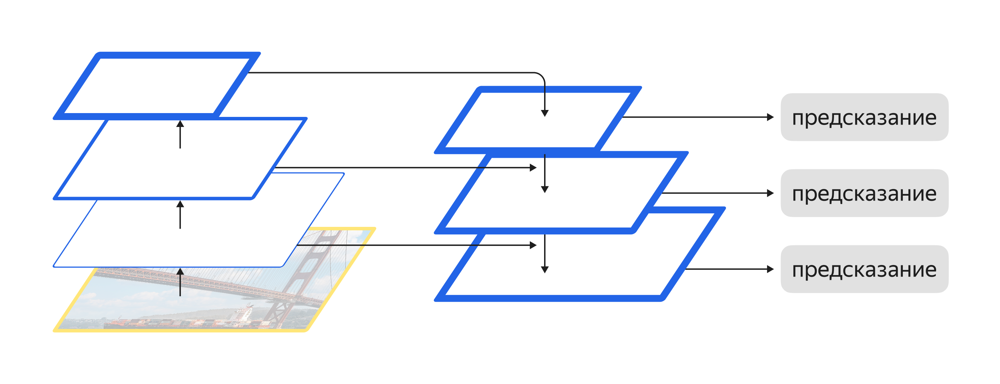

In [9]:
source: str = "ml_dl/cv/pyramid1.png"
show_image_from_source(source, width=800)

1. YOLOv3 берёт карту признаков с самого глубокого, семантически насыщенного слоя сети (например, 13×13). 

2. Затем модель увеличивает разрешение этой глубокой карты вдвое (upsampling) и объединяет её с картой признаков из более раннего, детализированного слоя. 

3. Этот процесс повторяется ещё раз: обогащённая карта среднего масштаба снова увеличивается в разрешении и смешивается с ещё более детализированными признаками с ранних слоёв. 

На выходе получается самая детализированная карта предсказаний (например, 52×52), которая идеально подходит для обнаружения самых маленьких объектов, часто терявшихся в предыдущих версиях.

В итоге YOLOv3 делает предсказания не на одной, а на трёх разных картах признаков (13×13, 26×26 и 52×52).

### backbone -> Darknet-53

Darknet-53 стала эффективной благодаря таким улучшениям: 

- Глубина — 53 свёрточных слоя.
    
- Остаточные соединения (Residual Connections).
    
- Отсутствие слоёв пулинга (Pooling Layers).

Darknet-53 не использует традиционные слои MaxPooling, он уменьшает пространственное разрешение по-другому — с помощью свёрточных слоев с шагом (stride), равным 2. Этот способ позволяет сети самой выучить, как оптимально сжимать информацию.

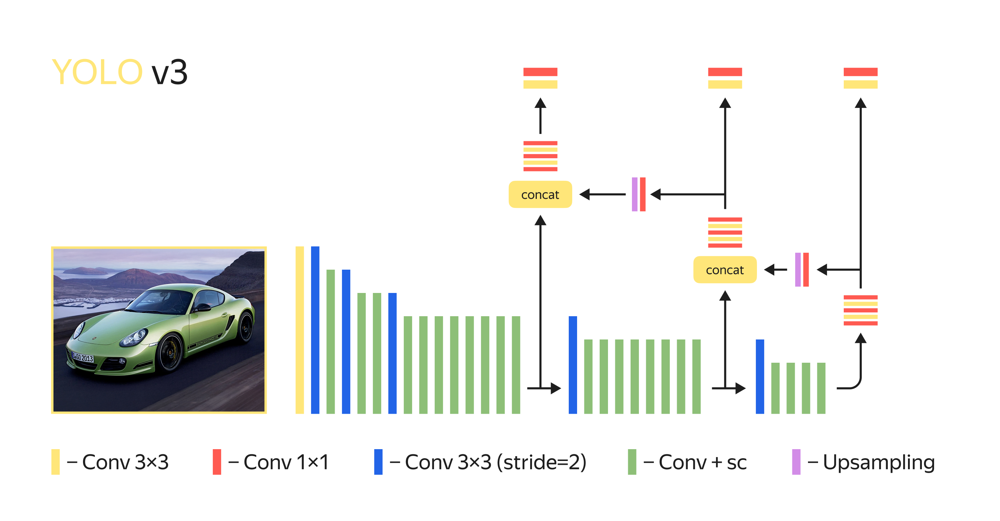

In [10]:
source: str = "ml_dl/cv/yolov31.png"
show_image_from_source(source, width=800)

### Якоря (Anchor Boxes)

Якори — основное нововведение в YOLOv3.

Новая модель для предсказания рамок использует набор якорей (Anchor Boxes) — заранее определённых шаблонных рамок с типичными соотношениями сторон. 

Задача сети упрощается: вместо абсолютных значений она теперь предсказывает небольшие отклонения (смещения) от наиболее подходящего якоря. 

Все якоря разделены на три группы по три якоря: 

- три больших якоря назначаются сетке 13x13,
  
- три средних якоря назначаются сетке 26x26,
    
- три маленьких якоря назначаются сетке 52x52.

Для каждого из этих трёх якорей сеть предсказывает:

- tx, ty — смещения центра якоря внутри этой ячейки;
    
- tw, th — коэффициенты для масштабирования ширины и высоты якоря;
    
- objectness — уверенность, что в этой рамке вообще есть объект;

- class probabilities — вероятности классов.

Как модели выбрать нужный якорь на этапе обучения?

Алгоритм такой:

1. Берётся реальный объект (ground truth box) с его рамкой.
    
2. Определяется, в какую ячейку какой сетки попадает его центр.
    
3. Система смотрит на три больших якоря, приписанных к этому уровню.
    
4. Вычисляется IoU (пересечение) между рамкой объекта и каждым из этих трёх якорей.
    
5. Тот якорь, у которого наибольшее IoU, объявляется ответственным за этот объект. 
    
Именно для этого одного ответственного якоря модель будет учиться предсказывать поправки (tx, ty, tw, th). Остальные два якоря в этой ячейке для этого объекта игнорируются.

Фиксированные якоря и их соотношения сторон определяются методом кластеризации K-Means на истинных рамках из обучающего датасета.

Берем все истинные рамки, собираем их параметры ширины и высоты в единую таблицу.

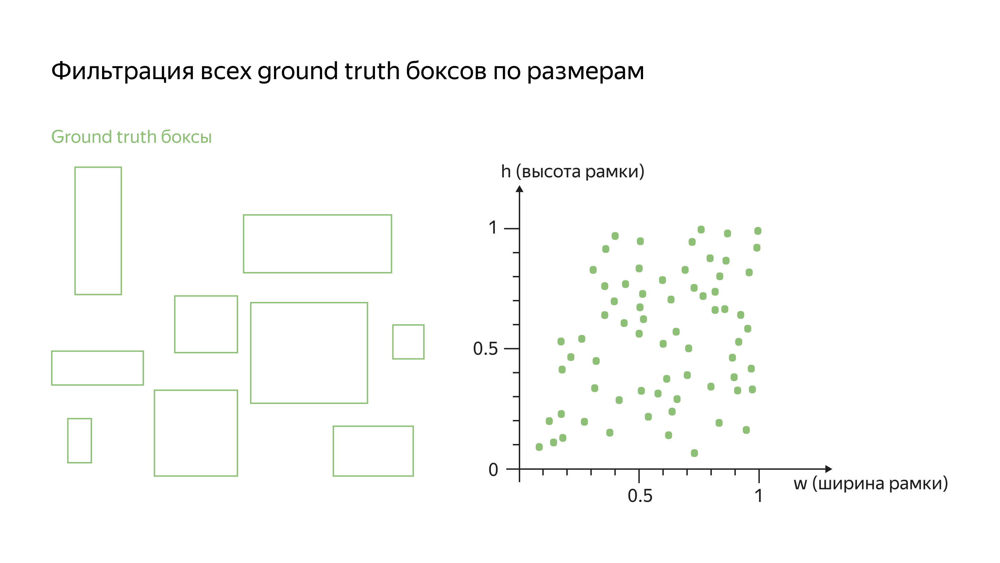

In [12]:
source: str = "ml_dl/cv/kmeans1.png"
show_image_from_source(source, width=800)

Применяем к этим данным кластеризацию на 9 центроид. (9 потенциально разных видов рамок)

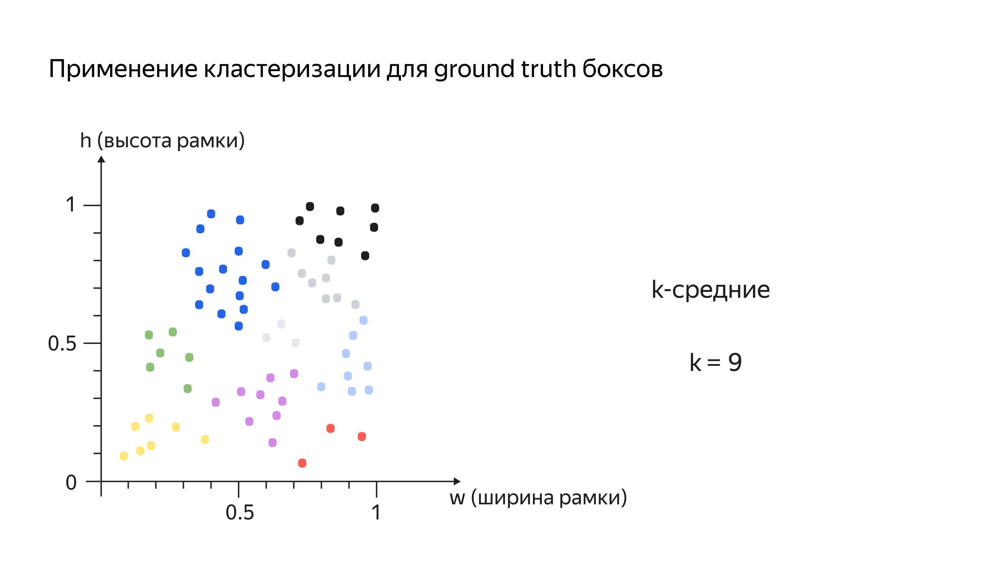

In [13]:
source: str = "ml_dl/cv/kmeans2.png"
show_image_from_source(source, width=800)

Как любую прогрессивную технологию, YOLOv3 не обошла болезнь роста. Информация от глубоких и поверхностных слоев смешивалась не всегда оптимально, а функция потерь, отвечающая за точность рамок, была «слепой» к перекрытиям или расстояниям между объектами.

К 2020 году у YOLOv3 накопилось несколько недостатков:

- Darknet-53 был хорош, но EfficientNet и другие новые архитектуры показали, что можно достичь той же точности меньшими затратами.
    
- FPN-подобная структура для смешивания признаков была хороша, но не идеальна для передачи информации между слоями.
    
- В YOLOv3 не использовались более совершенные функции потерь, которые сообщество уже активно применяло для улучшения результатов.

## YOLOv4-YOLOv5

Новшества в v4 концептуально не отличаются от v5. Поэтому подробно разберем эти концепции.

### Backbone: CSPDarknet53

За основу YOLOv4 приняли модифицированную архитектуру CSPDarknet53: оригинальную Darknet-53 из YOLOv3 улучшили с помощью концепции CSPNet (Cross-Stage-Partial Network).

Этот подход заключается в разделении потока признаков внутри одного этапа на две параллельные ветви:

- Одна ветвь проходит через блок свёрток,

- вторая ведёт напрямую к следующему этапу. 

В конце обе ветви конкатенируются. Такое разделение позволило cнизить вычислительную нагрузку, так как основной блок обработки получает лишь часть входных каналов, и улучшить распространение градиентов через сеть, что предотвращает их затухание и ускоряет обучение. 

Архитектура CSPNet представлена на картинке:

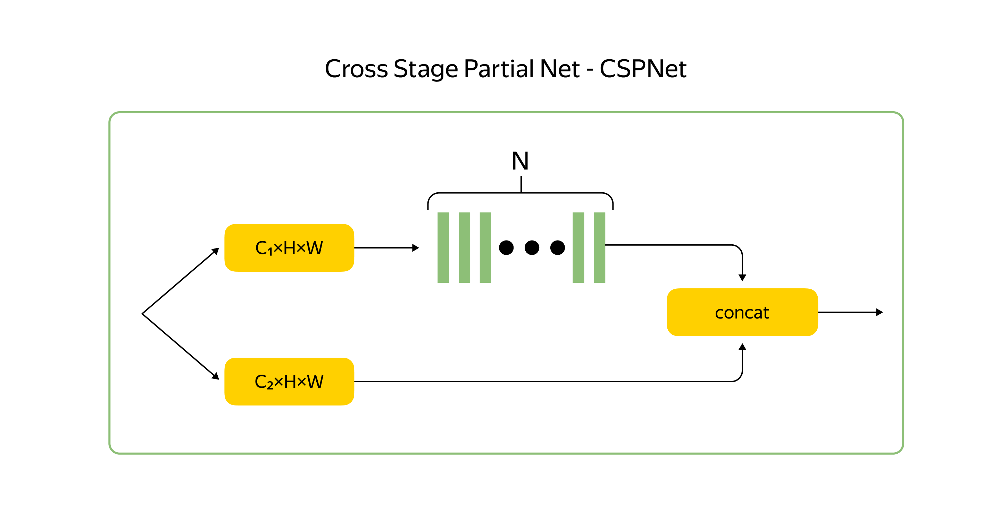

In [14]:
source: str = "ml_dl/cv/cspnet1.png"
show_image_from_source(source, width=800)

Первое ниже изображениеи - старая сеть на YOLOv3.
Еще ниже - новая сеть с CSP backbone.

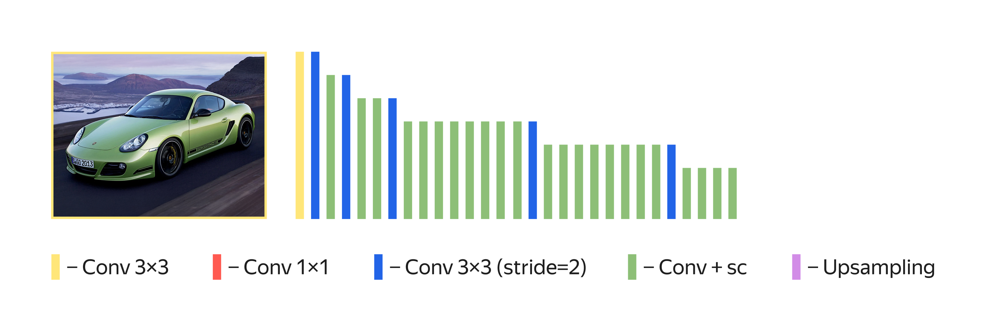

In [ ]:
source: str = "ml_dl/cv/backbonev3.png"
show_image_from_source(source, width=800)

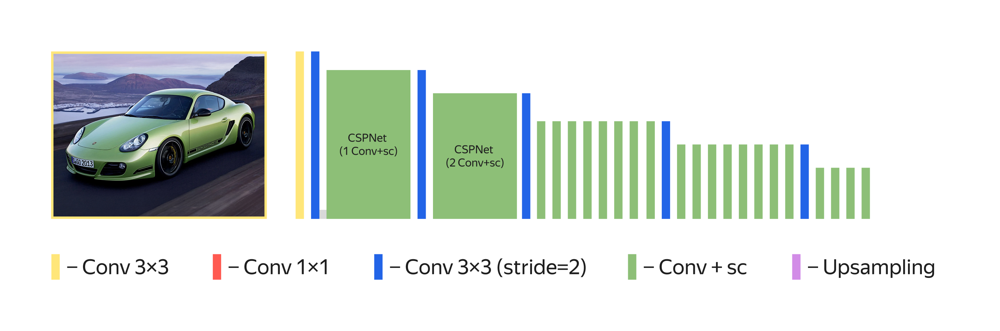

In [17]:
source: str = "ml_dl/cv/backbonev4_5.png"
show_image_from_source(source, width=800)

### Neck: комбинация SPP и PANet

1. **Сразу после Backbone в YOLOv4 добавили SPP (Spatial Pyramid Pooling).**

Этот блок обрабатывает карту признаков параллельными слоями Max-Pooling с ядрами разного размера: 5x5, 9x9 и 13x13. 

Результаты объединяются, что значительно увеличивает эффективное рецептивное поле модели и позволяет сети лучше улавливать глобальный контекст и различать объекты на сложном фоне.

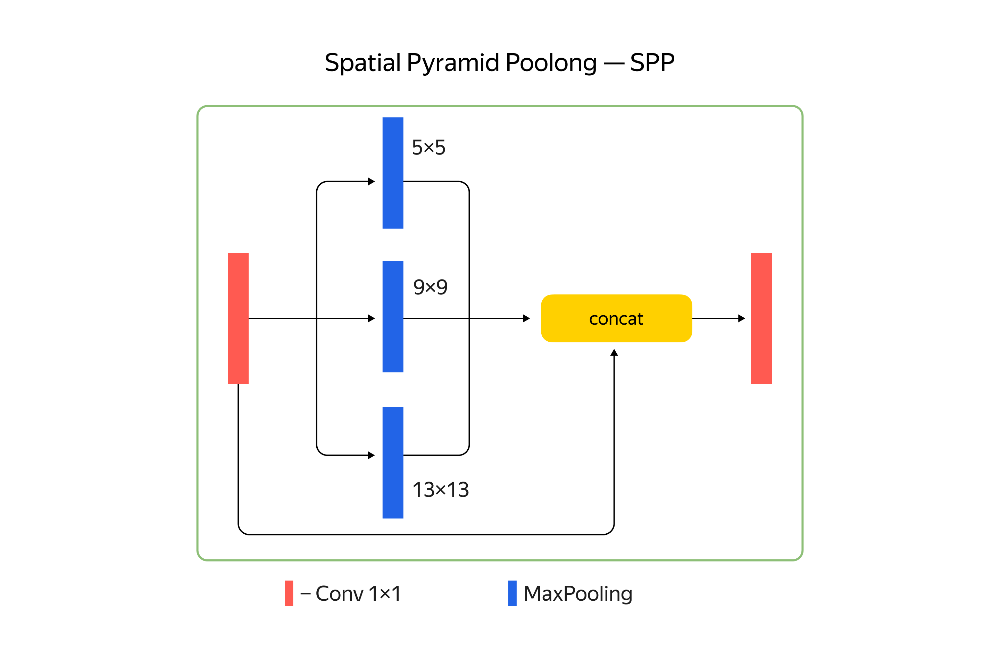

In [19]:
source: str = "ml_dl/cv/spp1.png"
show_image_from_source(source, width=800)

2. **Вместо FPN внедрили архитектуру PANet(Path Aggregation Network)**

В дополнение к стандартному пути сверху-вниз (top-down), который передаёт семантическую информацию на более детализированные слои, PANet добавляет второй, восходящий путь (снизу-вверх, bottom-up). 

Этот путь позволяет информации о точной локализации с низкоуровневых признаков эффективнее распространяться к более глубоким слоям, что улучшает точность позиционирования объектов.

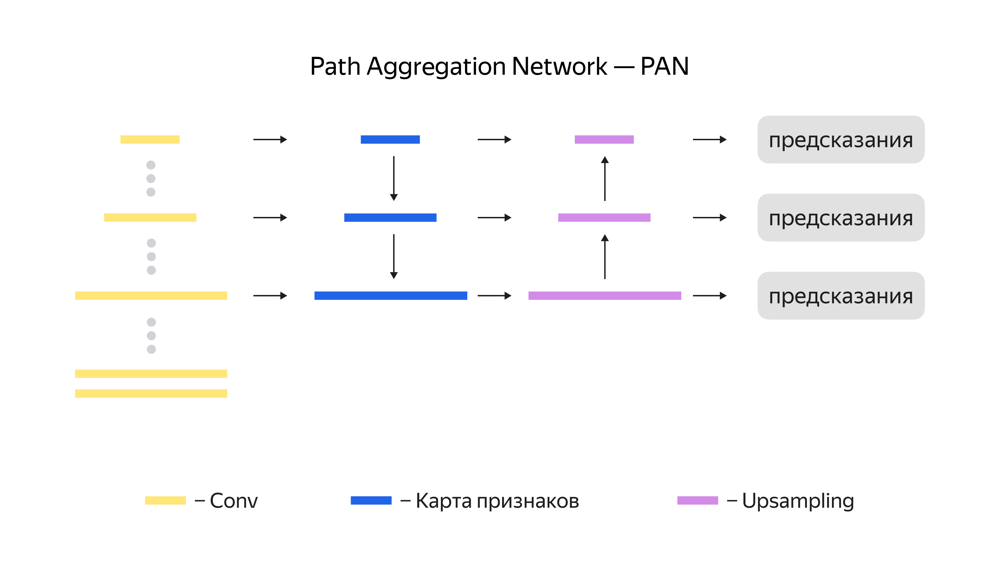

In [20]:
source: str = "ml_dl/cv/panet1.png"
show_image_from_source(source, width=800)

### C-IoU Loss

В предыдущих моделях в рамках loss мы использовали MSE для штрафов параметров x, y, w, h. Но MSE одинаково штрафует за одну и ту же абсолютную ошибку (например, в 10 пикселей) и маленькой, и большой рамки. 

В YOLOv1 пытались решить эту проблему с помощью квадратных корней для w и h, но это было лишь частичным и не самым элегантным решением.

В MSE четыре параметра рамки (x, y, w, h) рассматриваются как четыре независимые переменные. Для каждой из них вычисляются ошибки, которые затем суммируются. На самом деле эти переменные сильно связаны. Качество рамки определяется не точностью отдельной координаты, а их комбинацией.

На примере ниже видно, что для разных связок (x, y, w, h) мы получаем одинаковое значение MSE. Можно заметить, что если центры ground truth и предсказанного бокса расположены на одинаковом расстоянии, то MSE не меняется.

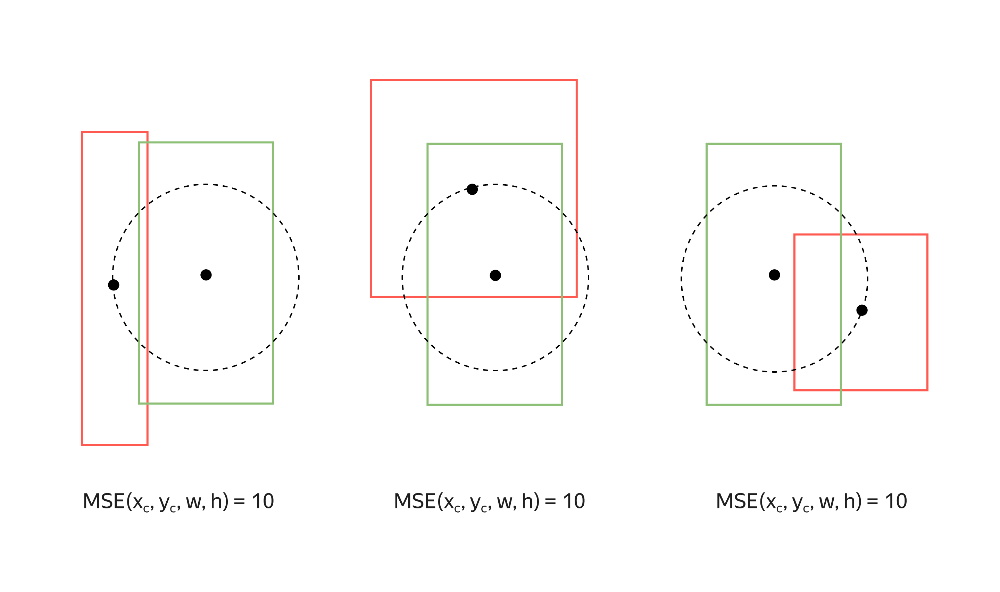

In [21]:
source: str = "ml_dl/cv/mseloss.png"
show_image_from_source(source, width=800)

Вместо такого расчёта инженеры пытались использовать IoU Loss (1 - IoU) для обучения регрессии рамок. Но у этого подхода есть два значимых недостатка:

- Если предсказанная и истинная рамки не пересекаются, то IoU = 0, а IoU Loss = 1. В этой ситуации градиент функции потерь равен нулю. Значит, независимо от расстояния между непересекающими рамками модель не будет учиться находить нужное положение.

- IoU не различает «хорошие» и «плохие» пересечения. Две разные предсказанные рамки могут иметь одинаковый IoU с истинной рамкой, но одна из них может быть очевидно лучше.

Первым решением проблем IoU и MSE было **GIoU (Generalized IoU)**. GIoU вводит «штрафной» член, который зависит от того, насколько далеко друг от друга находятся рамки.

Пусть у нас есть ground truth-рамка A и предсказанная рамка B.

- Сначала находим C — самую маленькую рамку (convex hull), которая полностью охватывает и предсказанную, и истинную рамки. 

- Затем вычисляем площадь S внутри рамки C за исключением площадей A и B. 

Итоговая метрика GIoU будет выглядеть так:
$$
GIoU = \frac{IoU - S}{Площадь(C)}.
$$

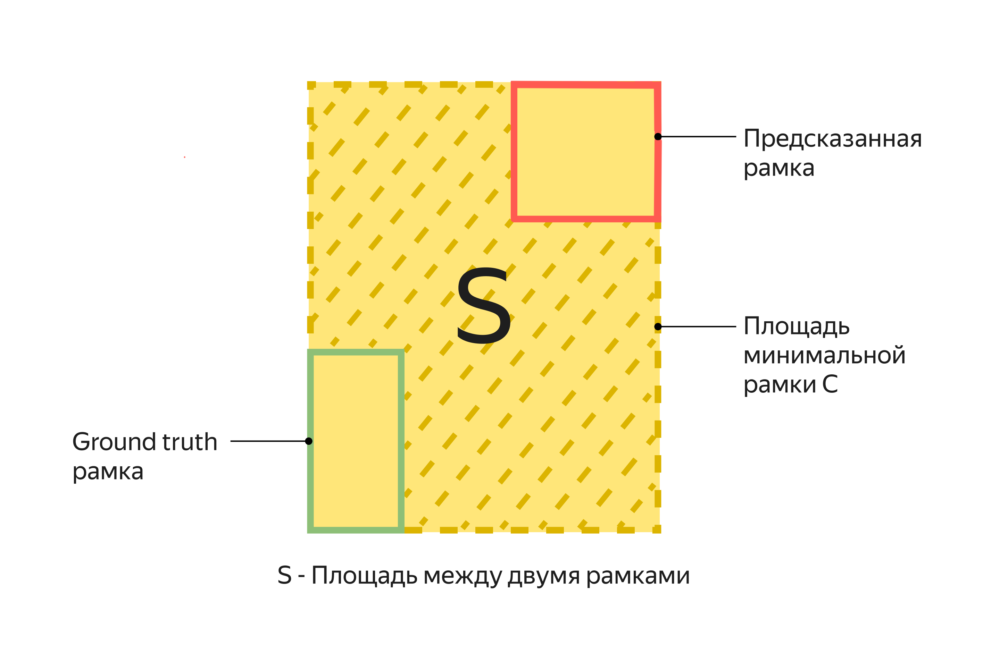

In [24]:
source: str = "ml_dl/cv/giou1.png"
show_image_from_source(source, width=800)

Таким образом, чем больше расстояние между предсказанной и GT-рамкой, тем больше будет площадь S и меньше метрика GIoU.

GIoU решала проблему «нулевого» градиента, но сходимость была всё ещё медленной. Если предсказанная рамка находится внутри истинной, GIoU вырождается в обычную IoU и теряет информацию о взаимном расположении.

**DIoU (Distance-IoU)** — ещё одна функция потерь, с помощью которой пытались решить проблемы предыдущих функций. 

DIoU вводит дополнительный штрафной член, который напрямую минимизирует нормализованное расстояние между центрами предсказанной и истинной рамок. Таким образом:
$$
DIoU=1−IoU+(\frac{ρ^2(b,b_{gt})}{c^2}),
$$
где:

- $ρ²(b, b_{gt})$ — квадрат Евклидова расстояния между центрами рамок;
    
- $c²$ — квадрат длины диагонали рамки C.

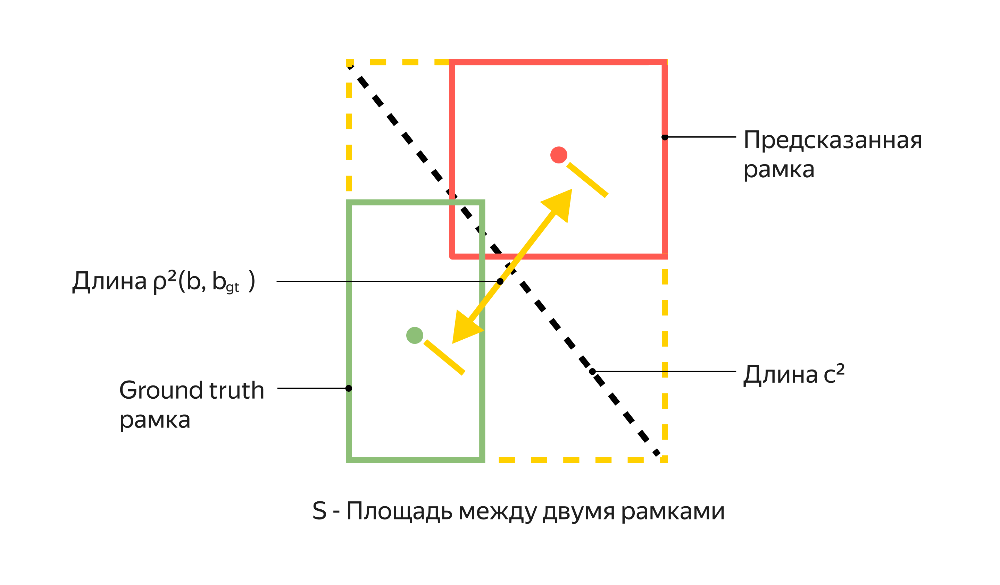

In [26]:
source: str = "ml_dl/cv/diou1.png"
show_image_from_source(source, width=800)

Градиент теперь напрямую тянет центр предсказанной рамки к центру истинной. Это гораздо более эффективный и прямой сигнал для обучения. Даже если одна рамка окажется внутри другой, DIoU будет продолжать минимизировать расстояние между их центрами, в то время как GIoU перестала бы меняться.

Но DIoU не учитывает соотношение сторон (aspect ratio) рамки. Модель может предсказать рамку с идеально совпадающим центром, но совершенно неправильной формы.

Другой же loss — **CIoU (Complete-IoU)**, который использовали в YOLOv4, добавляет к DIoU ещё один штрафной член, который отвечает за согласованность соотношения сторон:
$$
CIoU=DIoU+v.
$$
Таким образом, CIoU Loss одновременно минимизирует ошибку пересечения, ошибку в расстоянии между центрами и ошибку в соотношении сторон.

In [41]:
import torch

def diou_loss(preds, targets, eps=1e-7):
    # Конвертируем рамки в формат [x1, y1, x2, y2]
    preds_x1 = preds[..., 0] - preds[..., 2] / 2
    preds_y1 = preds[..., 1] - preds[..., 3] / 2
    preds_x2 = preds[..., 0] + preds[..., 2] / 2
    preds_y2 = preds[..., 1] + preds[..., 3] / 2
    
    targets_x1 = targets[..., 0] - targets[..., 2] / 2
    targets_y1 = targets[..., 1] - targets[..., 3] / 2
    targets_x2 = targets[..., 0] + targets[..., 2] / 2
    targets_y2 = targets[..., 1] + targets[..., 3] / 2

    # Вычисляем IoU
    # Найдем координаты области пересечения
    inter_x1 = torch.max(preds_x1, targets_x1)
    inter_y1 = torch.max(preds_y1, targets_y1)
    inter_x2 = torch.min(preds_x2, targets_x2)
    inter_y2 = torch.min(preds_y2, targets_y2)

    # Площадь пересечения. Используйте clamp для избежания отрицательных значений.
    inter_area = torch.clamp(inter_x2 - inter_x1, min=0)\
        * torch.clamp(inter_y2 - inter_y1, min=0)
    
    # Площади предсказанных и истинных рамок
    preds_area = preds[..., 2] * preds[..., 3]
    targets_area = targets[..., 2] * targets[..., 3]
    
    # Площадь объединения
    union_area = preds_area + targets_area - inter_area + eps
    
    # Итоговый IoU
    iou = inter_area / union_area

    # Вычисляем штраф за расстояние (Distance Penalty)
    # Квадрат расстояния между центрами рамок (rho^2)
    center_dist_sq = (preds[..., 0] - targets[..., 0])**2 + (preds[..., 1] - targets[..., 1])**2

    # Найдём координаты углов наименьшей рамки, которая охватывает обе (enclosing box)
    enclose_x1 = torch.min(preds_x1, targets_x1)
    enclose_y1 = torch.min(preds_y1, targets_y1)
    enclose_x2 = torch.max(preds_x2, targets_x2)
    enclose_y2 = torch.max(preds_y2, targets_y2)

    # Квадрат диагонали охватывающей рамки (c^2). Добавляем eps для стабильности
    enclose_diag_sq = (enclose_x2 - enclose_x1)**2 + (enclose_y2 - enclose_y1)**2 + eps

    
    # Штраф за расстояние (отношение квадрата расстояния между центрами к квадрату диагонали охватывающей рамки)
    distance_penalty = center_dist_sq / enclose_diag_sq


    # Собираем всё вместе
    diou = iou - distance_penalty
    
    # DIoU Loss определяется как 1 - DIoU
    loss = 1.0 - diou
    
    return loss

In [42]:
# Протестируем функцию
# 1: Рамки полностью совпадают, loss должен быть 0
boxes = torch.tensor([[0.5, 0.5, 0.2, 0.3]])
loss = diou_loss(boxes, boxes)
assert abs(loss.item() - 0.0) < 1e-5, f"loss должен быть ~0, а он {loss.item()}"

# 2: Рамки не пересекаются, loss должен быть > 1 из-за distance_penalty
preds_2 = torch.tensor([[2, 2, 1, 1]])
targets_2 = torch.tensor([[8, 8, 1, 1]])
loss_2 = diou_loss(preds_2, targets_2)
assert loss_2.item() > 1.0, f"loss должен быть > 1, а он {loss_2.item()}"

# 3: Рамки с одним центром, но разного размера. Loss должен быть > 0 и < 1
preds_3 = torch.tensor([[0.5, 0.5, 0.4, 0.4]])
targets_3 = torch.tensor([[0.5, 0.5, 0.2, 0.2]])
loss_3 = diou_loss(preds_3, targets_3)
assert 0.0 < loss_3.item() < 1.0, f"loss должен быть между 0 и 1, а он {loss_3.item()}"

# 4: Функция должна корректно работать с батчем из нескольких рамок
preds_4 = torch.tensor([
    [0.5, 0.5, 0.2, 0.2],  # Совпадающая
    [0.2, 0.2, 0.1, 0.1]   # Непересекающаяся
])
targets_4 = torch.tensor([
    [0.5, 0.5, 0.2, 0.2],
    [0.8, 0.8, 0.1, 0.1]
])
losses_4 = diou_loss(preds_4, targets_4)
assert losses_4.shape == (2,), f"форма результата должна быть (2,), а она {losses_4.shape}"
assert abs(losses_4[0].item() - 0.0) < 1e-5, f"loss для первой пары должен быть ~0, а он {losses_4[0].item()}"
assert losses_4[1].item() > 1.0, f"loss для второй пары должен быть > 1, а он {losses_4[1].item()}" 

### Class label smoothing (сглаживание меток классов)

Предположим, что мы учим модель распознавать классы «светофор», «машина» и «фара». 

Стандартный способ подготовить метки для обучения — one-hot encoding.

Во время обучения функция потерь заставляет модель предсказывать именно этот вектор. В итоге модель учится быть абсолютно уверенной в своих ответах и не учится обобщать, а просто «зазубривает» обучающие примеры, что приводит к переобучению. 

Она становится настолько уверена, что именно этот набор пикселей — на 100% светофор, что теряет гибкость при встрече с новым светофором в реальном мире.

Идея сглаживания меток состоит в том, чтобы не требовать от модели стопроцентной уверенности. Давайте скажем ей, что правильный ответ — это в основном светофор, но есть небольшой шанс, что это что-то другое.

Допустим, исходная метка классов та же, что мы определили раньше: `[1.0, 0.0., 0.0]`.

Зафиксируем небольшой параметр сглаживания $ε = 0.1$. 

Теперь вычтем из вероятности правильного класса этот параметр сглаживания и прибавим его значение, делённое на количество классов, ко всем остальным вероятностям:

`[1 - ε, 0.0 + ε / 3, 0.0 + ε / 3]`. 

Итоговые вероятности будут такими: `[0.933, 0.033, 0.033]`.

Параметр сглаживания действует как регулятор: чтобы минимизировать ошибку, модели приходится учить более тонкие и обобщённые признаки. Это значительно снижает необходимость переобучения и улучшает работу модели на новых данных.

Стоит учесть, что эта техника используется только на этапе обучения. Сама архитектура модели не меняется и на этапе предсказания модель не становится медленнее.

### Функция активации Mish
Функция активации добавляет нелинейность в нейронную сеть.

Долгое время стандартом была ReLU (Rectified Linear Unit):
$$
ReLU=max⁡(0,x)
$$
У этой функции есть известная проблема: если на вход нейрона приходит отрицательное число, выход ReLU равен 0, и, что ещё важнее, градиент тоже равен 0. Это значит, что для всех отрицательных входов нейрон «умирает» — он перестаёт обновлять свои веса и больше не участвует в обучении.

Чтобы решить эту проблему, появились вариации, например, LeakyReLU а еще SWISH, которая имеет небольшой наклон для отрицательных значений или гладкий подход около нуля, не давая нейрону полностью «умереть».

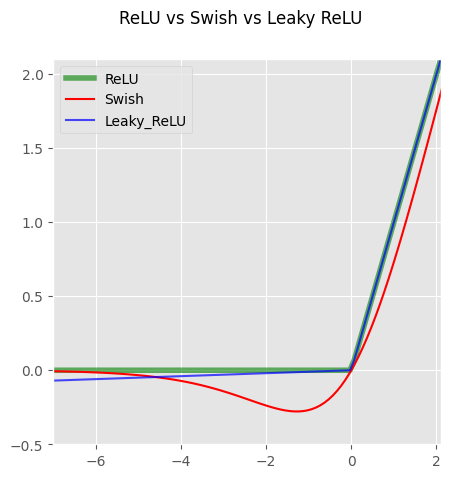

In [21]:
import numpy as np
import matplotlib.pyplot as plt

from ml_dl_experiments.dl import func_activation

x: np.ndarray = np.linspace(-7, 3, 100)
y: np.ndarray = func_activation.relu(x)

y_two: np.ndarray = func_activation.swish(x)
y_three: np.ndarray = func_activation.leaky_relu(x)

fig, ax = plt.subplots(figsize=(5, 5))
ax.plot(x, y, label="ReLU", c='g', linewidth=4, alpha=0.6)
ax.plot(x, y_two, label="Swish", c='r')
ax.plot(x, y_three, label="Leaky_ReLU", c='b', alpha=0.7)
plt.suptitle("ReLU vs Swish vs Leaky ReLU")
plt.ylim((-0.5, 2.1))
plt.xlim((-7, 2.1))
plt.xticks()
plt.yticks()
plt.legend()
plt.style.use("ggplot")
plt.show()

В 2019 году появилась новая функция активации Mish. Авторы стремились сделать её такой же быстрой, как ReLU, но более гладкой и без проблемы «умирающих» нейронов.

Формула такой функции активации имеет вид:
$$
Mish(x)=x⋅tanh⁡(ln⁡(1+e^x))
$$

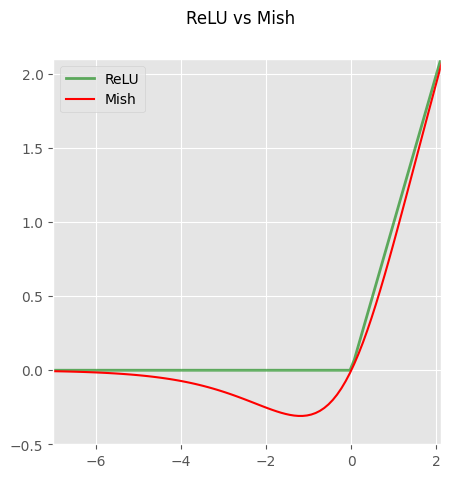

In [20]:
def mish(x: np.ndarray) -> np.ndarray:
    x = np.clip(x, -20, 20)
    return x * np.tanh(np.log(1 + np.exp(x)))

x: np.ndarray = np.linspace(-7, 3, 100)
y: np.ndarray = mish(x)

y_two: np.ndarray = func_activation.relu(x)

fig, ax = plt.subplots(figsize=(5, 5))
ax.plot(x, y_two, label="ReLU", c='g', linewidth=2, alpha=0.6)
ax.plot(x, y, label="Mish", c='r')
plt.suptitle("ReLU vs Mish")
plt.ylim((-0.5, 2.1))
plt.xlim((-7, 2.1))
plt.xticks()
plt.yticks()
plt.legend()
plt.style.use("ggplot")
plt.show()

В отличие от графика ReLU, у которого есть острый угол в точке x=0, функция Mish бесконечно дифференцируема (гладкая). 

Гладкая функция активации создаёт более гладкий ландшафт функции потерь (loss landscape). Это помогает оптимизатору (например, Adam или SGD) легче находить хороший минимум и приводит к лучшей сходимости и обобщению. Проще говоря модели легче учиться.

Ещё одно важное преимущество — Mish позволяет небольшим отрицательным значениям проходить дальше. Её график уходит немного в минус, а затем плавно возвращается к нулю. 

Сохранение небольших отрицательных значений помогает обогатить информацию и улучшить поток градиентов.

Кратко поразмыслим

- YOLOv4 вобрала в себя все лучшие архитектурные практики. За счёт улучшенной основы CSPDarknet53, умной «шеи» с SPP и PANet и продвинутой функции потерь CIoU авторы добились пиковой производительности для классического Anchor-Based-подхода. Получилась идеально сбалансированная точная модель.

- В YOLOv5 фокус сместился с архитектурных инноваций на практическое удобство и доступность. Ключевым стала не новая архитектура, а переход на популярный фреймворк PyTorch и создание целой экосистемы с простым и интуитивно понятным интерфейсом.

Все модели, начиная YOLOv2, используют якоря (Anchor Boxes). Этот подход, основанный на предсказании отклонений от заранее заданных шаблонов, доминировал в детекции объектов на протяжении многих лет и достиг своего пика в YOLOv4 и YOLOv5.

Параллельно развивалась совершенно иная, более элегантная парадигма — Anchor-Free-детекторы. 

Такие модели, как YOLOX, а потом и YOLOv8, полностью отказались от якорей и научились предсказывать рамки напрямую. Этот подход не только упростил архитектуру, но и открыл новые возможности для повышения точности и скорости. 